In [1]:
import os
import sys
sys.path.append(os.path.join(os.path.abspath(os.path.dirname("__file__")), '..'))
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.ticker import AutoMinorLocator
from utils import data_handling as dh
from utils import model_assessment as ma
from ipywidgets import interact

## Setup visualization settings

In [2]:
plt.style.use('seaborn-paper')
plt.rcParams['text.usetex'] = False
plt.rcParams['font.family'] = 'serif'
plt.rcParams['font.serif'] = ['Times New Roman']
plt.rcParams['figure.dpi'] = 1000
plt.rcParams['font.size'] = 30
plt.rcParams['axes.labelsize'] = 30
plt.rcParams['axes.titlesize'] = 40
plt.rcParams['legend.fontsize'] = 30
plt.rcParams['xtick.direction'] = 'in'
plt.rcParams['ytick.direction'] = 'in'
plt.rcParams['xtick.major.size'] = 30
plt.rcParams['xtick.minor.size'] = 20
plt.rcParams['ytick.major.size'] = 30
plt.rcParams['ytick.minor.size'] = 20
plt.rcParams['axes.linewidth'] = 1.0
plt.rcParams['legend.handlelength'] = 1.0
minor_locator = AutoMinorLocator(4)

## Load and prepare test data

In [3]:
cell_images, cell_labels, cell_types = dh.load_data_from_file('../data/labels.csv')

train_test_split = int(0.85 * cell_images.shape[0])
X_test, Y_test, Z_test = \
    cell_images[train_test_split : ], cell_labels[train_test_split : ], cell_types[train_test_split : ]
X_test, Y_test, Z_test = dh.preprocess_data(X_test, Y_test, Z_test)

## Assess training process

### Training vs. validation curve

In [4]:
history_fs = ['../models/history/Model_A_1.00.00_fs.npy', '../models/history/Model_B_1.00.00_fs.npy',
    '../models/history/Model_C_1.00.00_fs.npy', '../models/history/Model_D_1.00.00_fs.npy']
history_ss = ['../models/history/Model_A_1.00.00_ss.npy', '../models/history/Model_B_1.00.00_ss.npy',
    '../models/history/Model_C_1.00.00_ss.npy', '../models/history/Model_D_1.00.00_ss.npy']

fig, axs = plt.subplots(1, 3, figsize = (25,5))
for idx in range(3):
    history = np.load(history_fs[idx], allow_pickle = True).item()
    axs[idx].plot(history['accuracy'], color = 'tab:blue', label = 'accuracy')
    axs[idx].plot(history['val_accuracy'], color = 'tab:orange', label = 'val_accuracy')
    axs[idx].legend(loc = 'lower right', frameon = True)
    axs[idx].set_xlabel('Epoch')
    axs[idx].set_ylabel('Accuracy')
    axs[idx].set_title('Model Accuracy')
    plt.tight_layout
plt.show()

fig, axs = plt.subplots(1, 3, figsize = (25,5))
for idx in range(3):
    history = np.load(history_ss[idx], allow_pickle = True).item()
    axs[idx].plot(history['accuracy'], color = 'tab:blue', label = 'accuracy')
    axs[idx].plot(history['val_accuracy'], color = 'tab:orange', label = 'val_accuracy')
    axs[idx].legend(loc = 'lower right', frameon = True)
    axs[idx].set_xlabel('Epoch')
    axs[idx].set_ylabel('Accuracy')
    axs[idx].set_title('Model Accuracy')
    plt.tight_layout
plt.show()

### Accuracy, precision, recall, and F1-score on validation subsets 

In [5]:
val_results = []
for idx in range(4):
    val_result = ma.get_validation_accuracy_precision_recall_F1(history_ss[idx])
    val_results.append(val_result)

fig, axs = plt.subplots(1, 1, figsize = (10,10))
model_name = ['Model A', 'Model B', 'Model C', 'Model D']
labels = ['Accuracy', 'Precision', 'Recall', 'F1-score']

for idx in range(4):
    width = 0.5
    xposition = [0.0 + idx * width, 3.0 + idx * width, 6.0 + idx * width, 9.0 + idx * width]
    rects = axs.bar(xposition, val_results[idx], width, label = model_name[idx])
xposition = [0.0, 3.0, 6.0, 9.0]
plt.xticks(xposition, labels)
axs.set_xlabel('Validation Metric')
axs.set_ylabel('Range')
axs.yaxis.set_minor_locator(minor_locator)
axs.legend(model_name, loc = 'lower left')
plt.show()


## Assess test results

### Accuracy, precision, recall, and F1-score on test set

In [6]:
weights_ss = ['../models/weights/Model_A_1.00.00_ss.hdf5', '../models/weights/Model_B_1.00.00_ss.hdf5',
    '../models/weights/Model_C_1.00.00_ss.hdf5', '../models/weights/Model_D_1.00.00_ss.hdf5']

results = []
for _ , weight in enumerate(weights_ss):
    test_results = ma.get_test_accuracy_precision_recall_F1(weight, X_test, Y_test)
    results.append(test_results)
print(results)
   
fig, axs = plt.subplots(1, 1, figsize = (10,10))
model_name = ['Model A', 'Model B', 'Model C', 'Model D']
labels = ['Accuracy', 'Precision', 'Recall', 'F1-score']

for idx in range(4):
    width = 0.5
    xposition = [0.0 + idx * width, 3.0 + idx * width, 6.0 + idx * width, 9.0 + idx * width]
    rects = axs.bar(xposition, results[idx], width, label = model_name[idx])
xposition = [0.0, 3.0, 6.0, 9.0]
plt.xticks(xposition, labels)
axs.set_xlabel('Test Metric')
axs.set_ylabel('Range')
axs.yaxis.set_minor_locator(minor_locator)
axs.legend(model_name, loc = 'lower left')
plt.show()

13/13 [==============================] - 13s 462ms/step - loss: 12.6987 - accuracy: 0.6904 - precision: 0.3661 - recall: 0.4457
[[0.8502538204193115, 0.9024389982223511, 0.4021739065647125, 0.5563909662700547], [0.7360405921936035, 0.4333333373069763, 0.42391303181648254, 0.42857142455507874], [0.7944162487983704, 0.6341463327407837, 0.28260868787765503, 0.39097743451113454], [0.6903553009033203, 0.3660714328289032, 0.44565218687057495, 0.4019607921510144]]


### ROC and AUC on test set

In [7]:
results = []
for _ , weight in enumerate(weights_ss):
    test_results = ma.compute_AUC(weight, X_test, Y_test)
    results.append(test_results)

fig, axs = plt.subplots(1, 1, figsize = (10,10))
for idx in range(4):
    axs.plot(results[idx][1], results[idx][2], label = model_name[idx])

axs.set_xlabel('False Positive Rate')
axs.set_ylabel('True Positve Rate')
axs.xaxis.set_minor_locator(minor_locator)
axs.yaxis.set_minor_locator(minor_locator)
axs.legend(loc = 'lower right')
plt.show()


13/13 [==============================] - 10s 399ms/step


### Confusion matrix on test set

13/13 [==============================] - 10s 399ms/step


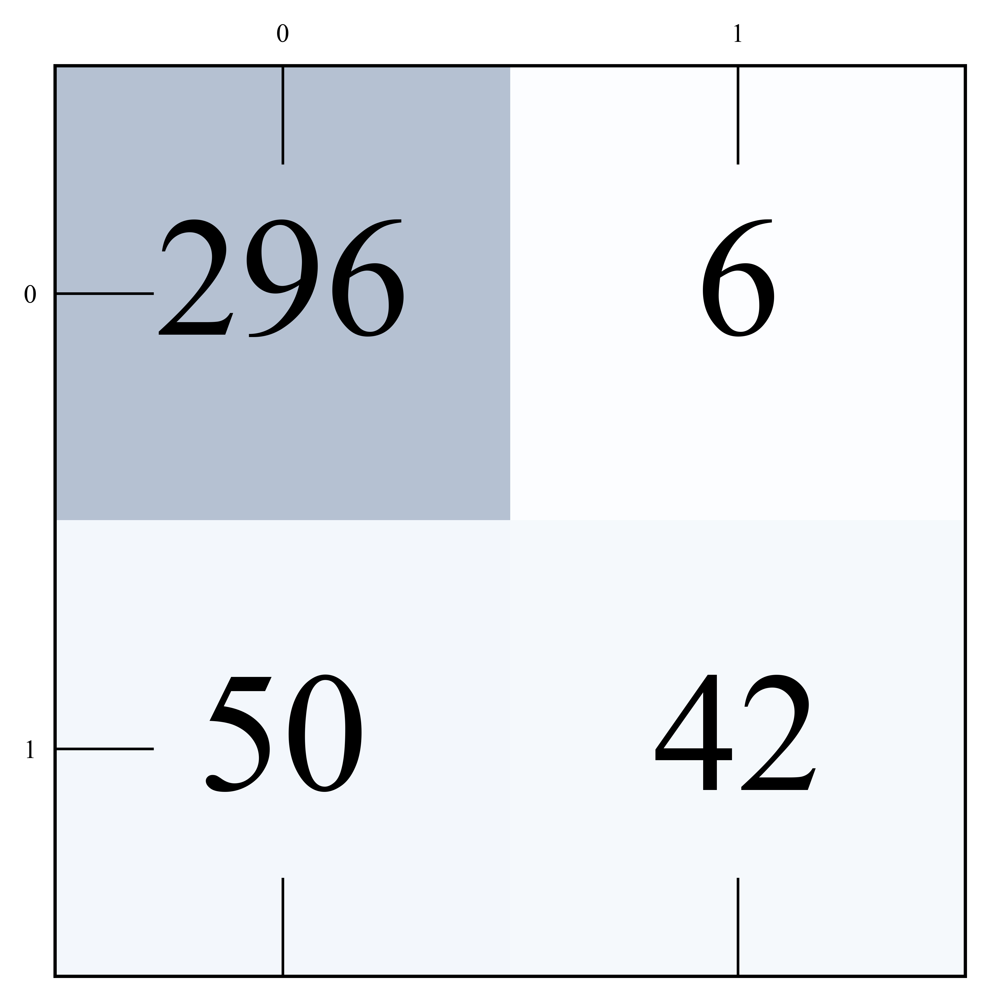

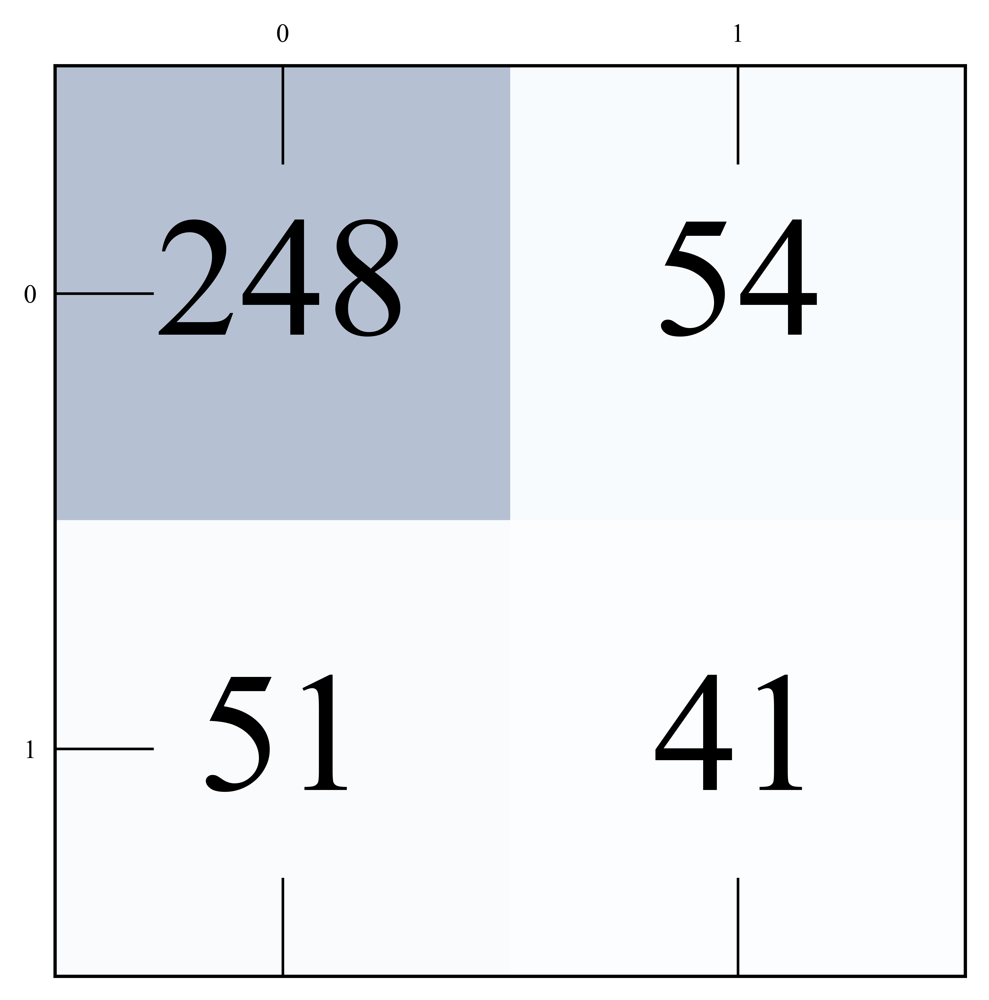

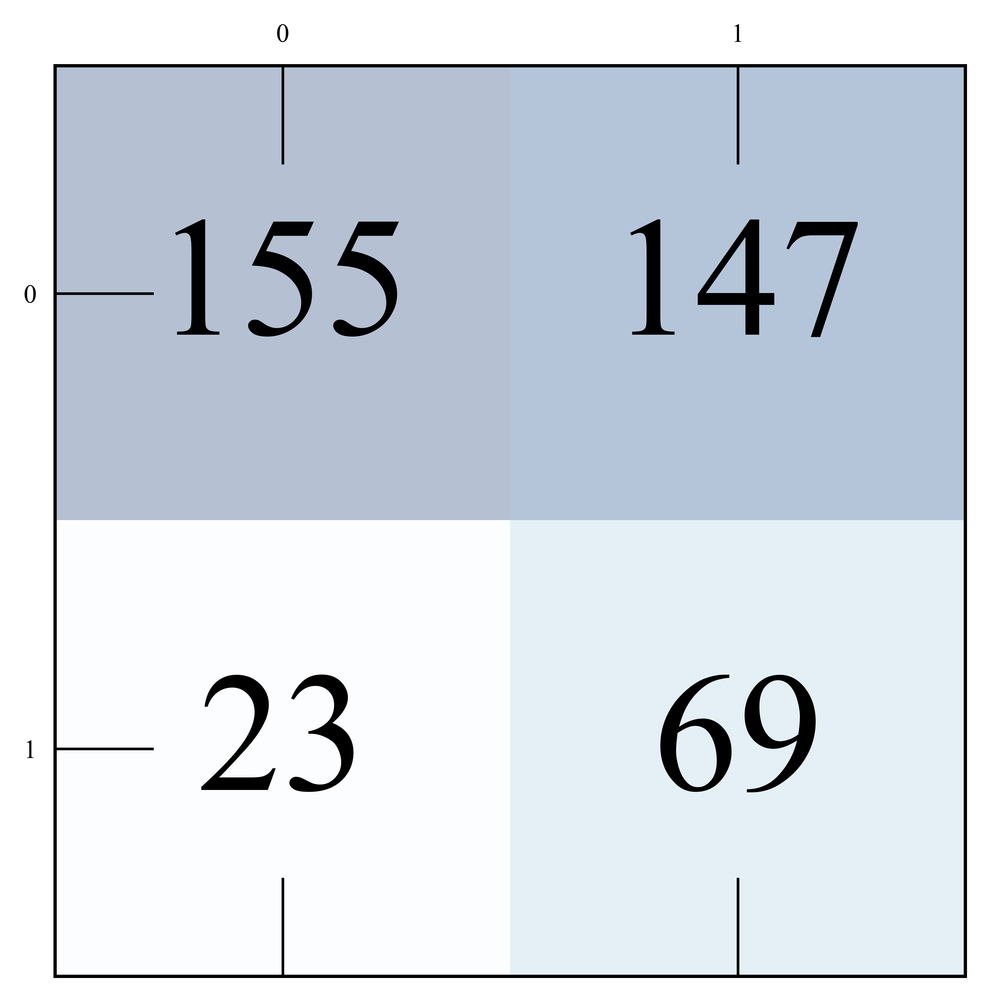

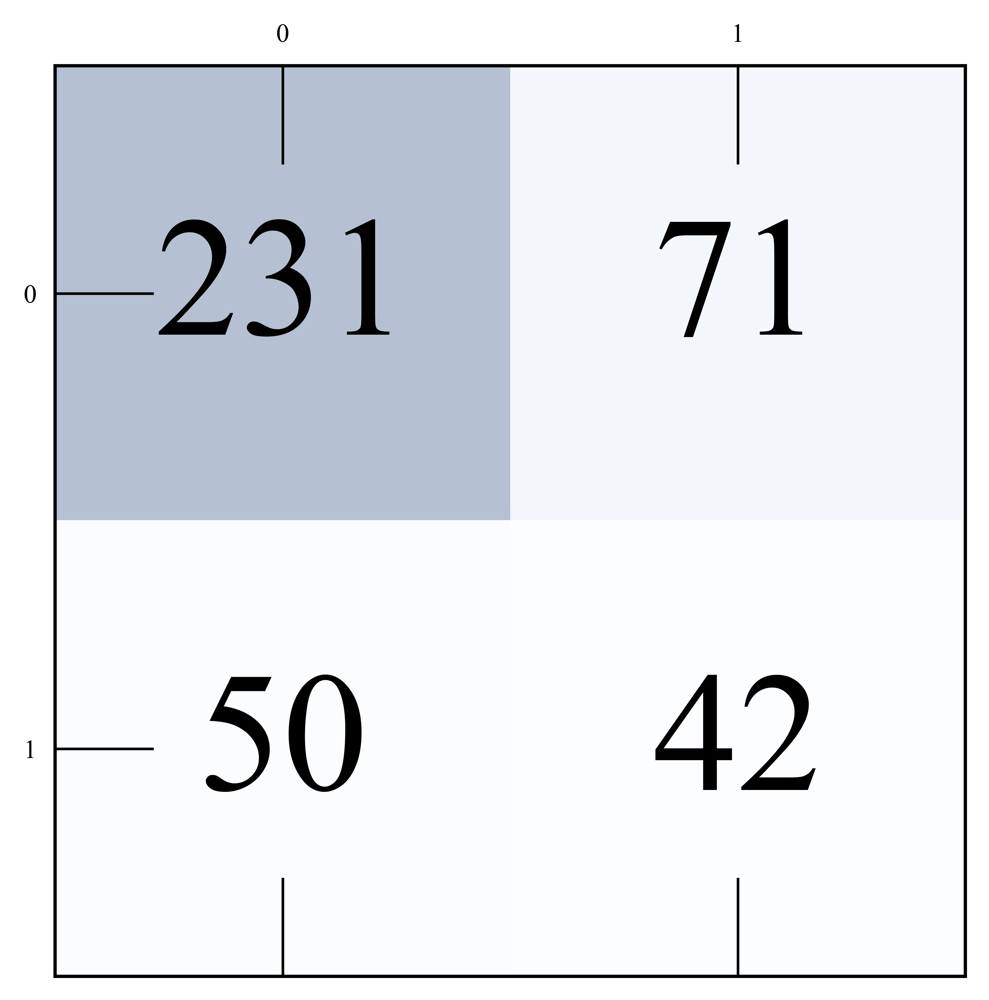

In [8]:
defect_probability = 0.3333333333333333
cms = []
for _ , weight in enumerate(weights_ss):
    model_cm = ma.compute_confusion_matrix(weight, X_test, Y_test, defect_probability)
    cms.append(model_cm)

for idx in range(4):
    fig, ax = plt.subplots(figsize = (5, 5))
    ax.matshow(cms[idx], cmap = plt.cm.Blues, alpha = 0.3)
    for i in range(cms[idx].shape[0]):
        for j in range(cms[idx].shape[1]):
            ax.text(x = j, y = i,s = cms[idx][i, j], va = 'center', ha = 'center', size = 'xx-large')

## Assess and visualize class activation maps (CAMs)

1/1 [==============================] - 0s 119ms/step
(1, 18, 18, 512)
(300, 300, 512)
(300, 300)
Predict Probability: [[0.03013329]] - Actual Probability: 1.0 - Cell Type: mono


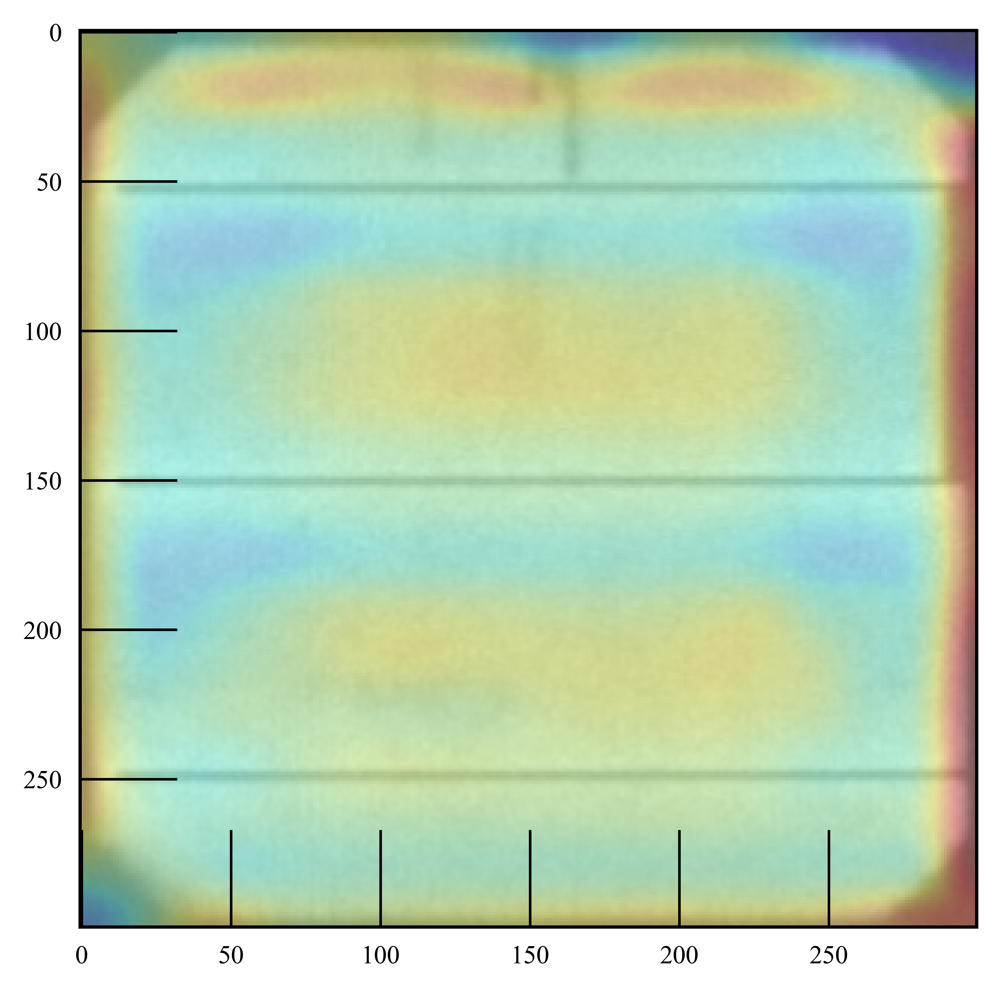

In [25]:
n = 324
cell_image = X_test[n]
cam_output, prediction = ma.compute_CAM(weights_ss[0], cell_image, 'block5_conv4', (18, 18))

fig, axs = plt.subplots(1, 1, figsize = (5,5))
axs.imshow(cell_image, cmap = 'gray', alpha = 0.7)
axs.imshow(cam_output, cmap = 'jet', alpha = 0.3)
print(f'Predict Probability: {prediction} - Actual Probability: {Y_test[n]} - Cell Type: {Z_test[n]}')